***
***
# 文本挖掘简介

***
***

王成军

wangchengjun@nju.edu.cn

计算传播网 http://computational-communication.com

# What can be learned from 5 million books

http://v.youku.com/v_show/id_XMzA3OTA5MjUy.html

This talk by Jean-Baptiste Michel and Erez Lieberman Aiden is phenomenal. 

Michel, J.-B., et al. (2011). Quantitative Analysis of Culture Using Millions of Digitized Books. Science, 331, 176–182.

![](./img/books.jpg)

试一下谷歌图书的数据: https://books.google.com/ngrams/
    

数据下载： http://www.culturomics.org/home

#  Bag-of-words model （BOW)

Represent text as numerical feature vectors

- We create a vocabulary of unique tokens—for example, words—from the entire set of documents.
- We construct a feature vector from each document that contains the counts of how often each word occurs in the particular document.

Since the unique words in each document represent only a small subset of all the
words in the bag-of-words vocabulary, the feature vectors will consist of mostly
zeros, which is why we call them sparse

<img src = './img/bagofwords.jpg' width = 500>

Bag of words，也叫做“词袋”，在信息检索中，Bag of words model假定对于一个文本，忽略其词序和语法，句法，将其仅仅看做是一个词集合，或者说是词的一个组合，文本中每个词的出现都是独立的，不依赖于其他词是否出现，或者说当这篇文章的作者在任意一个位置选择一个词汇都不受前面句子的影响而独立选择的。这种假设虽然对自然语言进行了简化，便于模型化。

假定在有些情况下是不合理的，例如在新闻个性化推荐中，采用Bag of words的模型就会出现问题。例如用户甲对“南京醉酒驾车事故”这个短语很感兴趣，采用bag of words忽略了顺序和句法，则认为用户甲对“南京”、“醉酒”、“驾车”和“事故”感兴趣，因此可能推荐出和“南京”，“公交车”，“事故”相关的新闻，这显然是不合理的。

解决的方法可以采用SCPCD的方法抽取出整个短语，或者采用高阶（2阶以上）统计语言模型，例如bigram，trigram来将词序保留下来，相当于bag of bigram和bag of trigram，这样能在一定程度上解决这种问题。简言之，bag of words模型是否适用需要根据实际情况来确定。对于那些不可以忽视词序，语法和句法的场合均不能采用bag of words的方法。

# Transforming words into feature vectors

A document-term matrix or term-document matrix is a mathematical matrix that describes the frequency of terms that occur in a collection of documents. 

In a document-term matrix, rows correspond to documents in the collection and columns correspond to terms. 

There are various schemes for determining the value that each entry in the matrix should take. One such scheme is tf-idf. They are useful in the field of natural language processing.

D1 = "I like databases"

D2 = "I hate databases"

|          |  I        |    like   |hate        | databases   |
| -------------|:-------------:|:-------------:|:-------------:|-----:|
| D1| 1| 1 | 0 |1|
| D2| 1| 0 | 1 |1|

In [24]:
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
count = CountVectorizer()
docs = np.array([
        'The sun is shining',
        'The weather is sweet',
        'The sun is shining and the weather is sweet'])
bag = count.fit_transform(docs)

['__abs__',
 '__add__',
 '__array_priority__',
 '__bool__',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__div__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__idiv__',
 '__imul__',
 '__init__',
 '__init_subclass__',
 '__isub__',
 '__iter__',
 '__itruediv__',
 '__le__',
 '__len__',
 '__lt__',
 '__matmul__',
 '__module__',
 '__mul__',
 '__ne__',
 '__neg__',
 '__new__',
 '__nonzero__',
 '__pow__',
 '__radd__',
 '__rdiv__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__rmatmul__',
 '__rmul__',
 '__rsub__',
 '__rtruediv__',
 '__setattr__',
 '__setitem__',
 '__sizeof__',
 '__str__',
 '__sub__',
 '__subclasshook__',
 '__truediv__',
 '__weakref__',
 '_add_dense',
 '_add_sparse',
 '_arg_min_or_max',
 '_arg_min_or_max_axis',
 '_binopt',
 '_boolean_index_to_array',
 '_check_boolean',
 '_check_ellipsis',
 '_cs_matrix__get_has_canonical_format',
 '_cs_matrix__get_sorted',
 '_cs_matrix_

In [28]:
' '.join(dir(count))  

'__class__ __delattr__ __dict__ __dir__ __doc__ __eq__ __format__ __ge__ __getattribute__ __getstate__ __gt__ __hash__ __init__ __init_subclass__ __le__ __lt__ __module__ __ne__ __new__ __reduce__ __reduce_ex__ __repr__ __setattr__ __setstate__ __sizeof__ __str__ __subclasshook__ __weakref__ _char_ngrams _char_wb_ngrams _check_stop_words_consistency _check_vocabulary _count_vocab _get_param_names _limit_features _sort_features _stop_words_id _validate_params _validate_vocabulary _white_spaces _word_ngrams analyzer binary build_analyzer build_preprocessor build_tokenizer decode decode_error dtype encoding fit fit_transform fixed_vocabulary_ get_feature_names get_params get_stop_words input inverse_transform lowercase max_df max_features min_df ngram_range preprocessor set_params stop_words stop_words_ strip_accents token_pattern tokenizer transform vocabulary vocabulary_'

In [2]:
count.get_feature_names()

['and', 'is', 'shining', 'sun', 'sweet', 'the', 'weather']

In [34]:
print(count.vocabulary_)

{'the': 5, 'sun': 3, 'is': 1, 'shining': 2, 'weather': 6, 'sweet': 4, 'and': 0}


In [4]:
type(bag)

scipy.sparse.csr.csr_matrix

In [5]:
print(bag.toarray())

[[0 1 1 1 0 1 0]
 [0 1 0 0 1 1 1]
 [1 2 1 1 1 2 1]]


In [6]:
import pandas as pd
pd.DataFrame(bag.toarray(), columns = count.get_feature_names())

,and,is,shining,sun,sweet,the,weather
0,0,1,1,1,0,1,0
1,0,1,0,0,1,1,1
2,1,2,1,1,1,2,1


# 1-gram
The sequence of items in the bag-of-words model that we just created is also called the 1-gram or unigram model
- each item or token in the vocabulary represents a single word. 

# n-gram
The choice of the number n in the n-gram model depends on the particular application

- 1-gram: "the", "sun", "is", "shining"
- 2-gram: "the sun", "sun is", "is shining" 

The CountVectorizer class in scikit-learn allows us to use different
n-gram models via its `ngram_range` parameter. 

While a 1-gram
representation is used by default

we could switch to a 2-gram
representation by initializing a new CountVectorizer instance with
ngram_range=(2,2).

# Assessing word relevancy via term frequency-inverse document frequency

# $tf-idf(t, d) = tf(t, d) \times idf(t)$ 

## $tf(t, d)$ is the term frequency of term t in document d.

## inverse document frequency $idf(t)$ can be calculated as:

# $idf(t) = log \frac{n_d}{1 + df(d, t)}$

[SKlearn use_idf=True, smooth_idf=True](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfTransformer.html#sklearn.feature_extraction.text.TfidfTransformer)

# $idf(t) = log \frac{n_d}{df(d, t) + 1} + 1$

## where $n_d$ is the total number of documents, and $df(d, t)$ is the number of documents $d$ that contain the term $t$. 



# 提问: Why do we add the constant 1 to the denominator ?
![](./img/ask.jpeg)

# 课堂作业：请根据公式计算'is'这个词在文本2中的tfidf数值？

![](./img/ask.jpeg)

# TfidfTransformer
Scikit-learn implements yet another transformer, the TfidfTransformer, that
takes the raw term frequencies from CountVectorizer as input and transforms
them into tf-idfs:

In [7]:
from sklearn.feature_extraction.text import TfidfTransformer
np.set_printoptions(precision=2)

tfidf = TfidfTransformer(use_idf=True, norm='l2', smooth_idf=True)
print(tfidf.fit_transform(count.fit_transform(docs)).toarray())


[[ 0.    0.43  0.56  0.56  0.    0.43  0.  ]
 [ 0.    0.43  0.    0.    0.56  0.43  0.56]
 [ 0.4   0.48  0.31  0.31  0.31  0.48  0.31]]


In [16]:
from sklearn.feature_extraction.text import TfidfTransformer
np.set_printoptions(precision=2)

tfidf = TfidfTransformer(use_idf=True, norm=None, smooth_idf=True)
print(tfidf.fit_transform(count.fit_transform(docs)).toarray())


[[ 0.    1.    1.29  1.29  0.    1.    0.  ]
 [ 0.    1.    0.    0.    1.29  1.    1.29]
 [ 1.69  2.    1.29  1.29  1.29  2.    1.29]]


In [17]:
import pandas as pd
bag = tfidf.fit_transform(count.fit_transform(docs))
pd.DataFrame(bag.toarray(), columns = count.get_feature_names())

,and,is,shining,sun,sweet,the,weather
0,0.000000,1.0,1.287682,1.287682,0.000000,1.0,0.000000
1,0.000000,1.0,0.000000,0.000000,1.287682,1.0,1.287682
2,1.693147,2.0,1.287682,1.287682,1.287682,2.0,1.287682


In [19]:
# 一个词的tfidf值
import numpy as np
tf_is = 2.0
n_docs = 3.0
#idf_is = np.log(n_docs / (3))
idf_is = np.log(n_docs / (3)) + 1

tfidf_is = tf_is * idf_is
print('tf-idf of term "is" = %.2f' % tfidf_is)

tf-idf of term "is" = 2.00


In [20]:
# 最后一个文本里的词的tfidf原始数值（未标准化）
tfidf = TfidfTransformer(use_idf=True, norm=None, smooth_idf=False)
raw_tfidf = tfidf.fit_transform(count.fit_transform(docs)).toarray()[-1]
raw_tfidf, count.get_feature_names()

(array([ 2.1 ,  2.  ,  1.41,  1.41,  1.41,  2.  ,  1.41]),
 ['and', 'is', 'shining', 'sun', 'sweet', 'the', 'weather'])

# The tf-idf equation that was implemented in scikit-learn is as follows: 

# $tf-idf(t, d) = tf(t, d) \times （idf(t, d) + 1）$ 

# L2-normalization

$l2_{x} = \frac{x} {np.sqrt(np.sum(x^2))}$



In [21]:
# l2标准化后的tfidf数值
l2_tfidf = raw_tfidf / np.sqrt(np.sum(raw_tfidf**2))
l2_tfidf 

array([ 0.47,  0.44,  0.31,  0.31,  0.31,  0.44,  0.31])

# 政府工作报告文本挖掘

## 0. 读取数据

In [124]:
with open('../data/gov_reports1954-2017.txt', 'r', encoding = 'utf-8') as f:
    reports = f.readlines()

In [125]:
len(reports)

48

In [126]:
reports[4]

'1959\t\t\t\t\t\t1959年国务院政府工作报告\t——1959年4月18日在第二届全国人民代表大会第一次会议上\t\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\xa0 国务院总理周恩来\t各位代表：\t\u3000\u3000我现在根据国务院的决定，向第二届全国人民代表大会第一次会议作政府工作报告。\t\u3000\u3000一、第一个五年计划时期内和第二个五年计划的第一年——一九五八年的伟大成就\t\u3000\u3000在第一届全国人民代表大会的四年多的任期中间，我们的国家经历了一系列的具有重大历史意义的变化。\t\u3000\u3000当一九五四年第一届全国人民代表大会第一次会议召开的时候，我国社会主义经济已经在国民经济中居于主导的地位，但是，我国还存在着大量的资本主义的工业和商业，并且大量地存在着个体的农业和手工业。农村中劳动互助运动已经广泛地发展起来，参加农业劳动互助组的农户达到了百分之六十左右，但是，组成农业生产合作社的农户还只占农户总数的百分之二左右。在那时候，我国已经完成了经济恢复时期的任务，开始了大规模的、有计划的经济建设。但是，究竟我们能不能在一个较短的时间内，使我国这样一个有六亿多人口的大国，建立起社会主义工业化的基础来，还有待于事实的证明。而现在呢？大家看到，只经过四年多的时间，我国人民，在中国共产党和毛泽东主席的领导下，已经在社会主义革命方面和在社会主义建设方面，获得了多么辉煌的成就！（鼓掌）\t\u3000\u3000在一九五五年和一九五六年，我们国家对资本主义工商业和对农业、手工业进行了全面的社会主义改造，基本上完成了在生产资料所有制方面的社会主义革命的任务。现在，除了个别的少数民族地区以外，我国基本上只有两种生产资料所有制，这就是社会主义的全民所有制和社会主义的集体所有制。在一九五七年和一九五八年上半年，我国人民又进行了全民整风运动和反右派斗争，在思想战线和政治战线方面取得了社会主义革命的伟大胜利。这样，在两条道路的斗争中，社会主义就在各个方面基本上战胜了资本主义。（鼓掌）\t\u3000\u3000我国的社会主义建设是跟社会主义革命同时进行和互相促进的。从一九五三年到一九

In [73]:
print(reports[0][:1000])

1954	1954年政府工作报告——1954年5月23日在中华人民共和国第一届全国人民代表大会第一次会议上　　　　　　　　　　　　　　　　　　　　　　　　  国务院总理周恩来各位代表：　　我们第一届全国人民代表大会第一次会议，在听了刘少奇同志关于宪法草案的报告并进行了三天的讨论以后，已经光荣地完成了一件历史性的工作，通过了我们国家的根本法——中华人民共和国宪法，接着，又通过了几个重要的法律。现在，我代表中央人民政府作工作报告。　　我国伟大的人民革命的根本目的，是在于从帝国主义、封建主义和官僚资本主义的压迫下面，最后也从资本主义的束缚和小生产的限制下面，解放我国的生产力，使我国国民经济能够沿着社会主义的道路而得到有计划的迅速的发展，以便提高人民的物质生活和文化生活的水平，并且巩固我们国家的独立和安全。我国的经济原来是很落后的；如果我们不建设起强大的现代化的工业、现代化的农业、现代化的交通运输业和现代化的国防，我们就不能摆脱落后和贫困，我们的革命就不能达到目的。在一九四九年至一九五二年间，中央人民政府按照中国人民政治协商会议共同纲领的规定，先后完成了全国大陆的统一，完成了土地制度的改革，进行了广泛的和深入的镇压反革命运动和各种民主改革运动，恢复了遭受长期战争破坏的国民经济，着重地发展了社会主义的国营经济和各种类型的合作社经济，初步地调整了公私营工商业之间的关系，这一切都为有计划地进行经济建设和逐步过渡到社会主义社会准备了必要的条件。随后，从一九五三年起，我国就开始了经济建设的第一个五年计划，着手有系统地逐步地实现国家的社会主义工业化和对农业、手工业和资本主义工商业的社会主义改造。经济建设工作在整个国家生活中已经居于首要的地位。　　制订第一个五年计划的全部工作现在还没有最后完成，对于计划的许多细节还在进行补充和修订。第一个五年计划的方针是大家已经知道的，这就是：集中主要力量发展重工业，建立国家工业化和国防现代化的基础；相应地发展交通运输业、轻工业、农业和商业；相应地培养建设人才；有步骤地促进农业、手工业的合作化；继续进行对资本主义工商业的改造；保证国民经济中社会主义成份的比重稳步增长，同时正确地发挥个体农业、手工业和资本主义工商业的作用；保证在发展生产的基础上逐步提高人民物质生活和文化生活的水平。第一个五年计划所以要集中主要力量发展重工业，即冶金工业、燃料工业、动力工业、

# pip install jieba
> https://github.com/fxsjy/jieba

# pip install wordcloud
>  https://github.com/amueller/word_cloud

# pip install gensim


# 在terminal里成功安装第三方的包，结果发现在notebook里无法import
> 这个问题多出现于mac用户，因为mac有一个系统自带的python，成功安装的第三方包都被安装到了系统自带的python里。因此需要确保我们使用的是conda自己的pip，即需要指定pip的路径名，比如我的pip路径名在：/Users/chengjun/anaconda/bin/pip,那么在terminal里输入：
# /Users/chengjun/anaconda/bin/pip install package_name

In [74]:
%matplotlib inline
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import sys 
import numpy as np
from collections import defaultdict
import statsmodels.api as sm
from wordcloud import WordCloud
import jieba
import matplotlib
import gensim
from gensim import corpora, models, similarities
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
#matplotlib.rcParams['font.sans-serif'] = ['Microsoft YaHei'] #指定默认字体 
matplotlib.rc("savefig", dpi=400)

In [75]:
# 为了确保中文可以在matplotlib里正确显示
#matplotlib.rcParams['font.sans-serif'] = ['Microsoft YaHei'] #指定默认字体 
# 需要确定系统安装了Microsoft YaHei

In [76]:
# import matplotlib
# my_font = matplotlib.font_manager.FontProperties(
#     fname='/Users/chengjun/github/cjc/data/msyh.ttf')

# 1. 分词

In [77]:
import jieba

seg_list = jieba.cut("我来到北京清华大学", cut_all=True)
print("Full Mode: " + "/ ".join(seg_list))  # 全模式

seg_list = jieba.cut("我来到北京清华大学", cut_all=False)
print("Default Mode: " + "/ ".join(seg_list))  # 精确模式

seg_list = jieba.cut("他来到了网易杭研大厦")  # 默认是精确模式
print(", ".join(seg_list))

seg_list = jieba.cut_for_search("小明硕士毕业于中国科学院计算所，后在日本京都大学深造")  # 搜索引擎模式
print(", ".join(seg_list))

Full Mode: 我/ 来到/ 北京/ 清华/ 清华大学/ 华大/ 大学
Default Mode: 我/ 来到/ 北京/ 清华大学
他, 来到, 了, 网易, 杭研, 大厦
小明, 硕士, 毕业, 于, 中国, 科学, 学院, 科学院, 中国科学院, 计算, 计算所, ，, 后, 在, 日本, 京都, 大学, 日本京都大学, 深造


## 2. 停用词

In [78]:
filename = '../data/stopwords.txt'
stopwords = {}
f = open(filename, 'r')
line = f.readline().rstrip()
while line:
    stopwords.setdefault(line, 0)
    stopwords[line] = 1
    line = f.readline().rstrip()
f.close()


In [28]:
adding_stopwords = [u'我们', u'要', u'地', u'有', u'这', u'人',
                    u'发展',u'建设',u'加强',u'继续',u'对',u'等',
                    u'推进',u'工作',u'增加']
for s in adding_stopwords: stopwords[s]=10

## 3. 关键词抽取

### 基于TF-IDF 算法的关键词抽取

In [79]:
import jieba.analyse
txt = reports[-1]
tf = jieba.analyse.extract_tags(txt, topK=200, withWeight=True)

In [80]:
u"、".join([i[0] for i in tf[:50]])

'改革、发展、推进、加强、建设、完善、深化、加快、创新、企业、推动、支持、全面、促进、坚持、就业、政府、政策、脱贫、服务、经济、群众、健全、保障、基本、机制、继续、小微、落实、优化、习近平、提高、坚决、加大、社会、实施、治理、减税、中国、风险、体系、防治、农村、深入、教育、监管、扩大、工作、人民、市场主体'

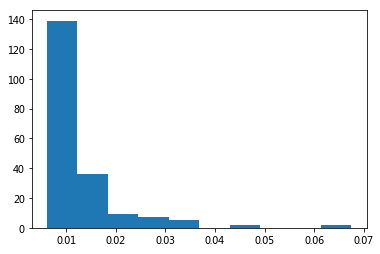

In [81]:
plt.hist([i[1] for i in tf])
plt.show()

### 基于 TextRank 算法的关键词抽取

In [82]:
tr = jieba.analyse.textrank(txt,topK=200, withWeight=True)
u"、".join([i[0] for i in tr[:50]])

'发展、改革、加强、建设、推进、完善、加快、推动、经济、企业、创新、支持、政策、促进、服务、全面、政府、中国、基本、继续、坚持、社会、提高、机制、群众、实施、就业、市场、保障、问题、加大、优化、扩大、风险、工作、治理、投资、国际、制度、提升、地方、力度、增强、深入、体系、国家、教育、降低、人民、合作'

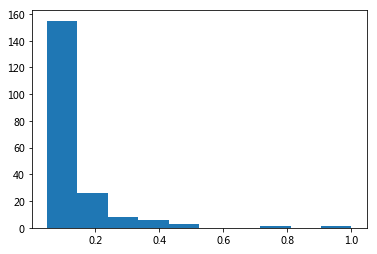

In [83]:
plt.hist([i[1] for i in tr])
plt.show()

In [84]:
import pandas as pd

def keywords(index):
    txt = reports[-index]
    tf = jieba.analyse.extract_tags(txt, topK=200, withWeight=True)
    tr = jieba.analyse.textrank(txt,topK=200, withWeight=True)
    tfdata = pd.DataFrame(tf, columns=['word', 'tfidf'])
    trdata = pd.DataFrame(tr, columns=['word', 'textrank'])
    worddata = pd.merge(tfdata, trdata, on='word')
    fig = plt.figure(figsize=(16, 6),facecolor='white')
    plt.plot(worddata.tfidf, worddata.textrank, linestyle='',marker='.')
    for i in range(len(worddata.word)):
        plt.text(worddata.tfidf[i], worddata.textrank[i], worddata.word[i], 
                 fontsize = worddata.textrank[i]*30, 
                 color = 'red', rotation = 0
                )
    plt.title(txt[:4])
    plt.xlabel('Tf-Idf')
    plt.ylabel('TextRank')
    plt.show()

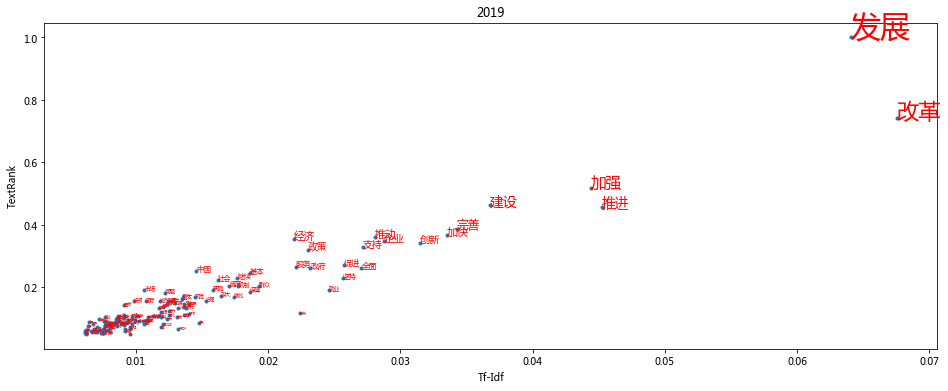

In [85]:
keywords(1)

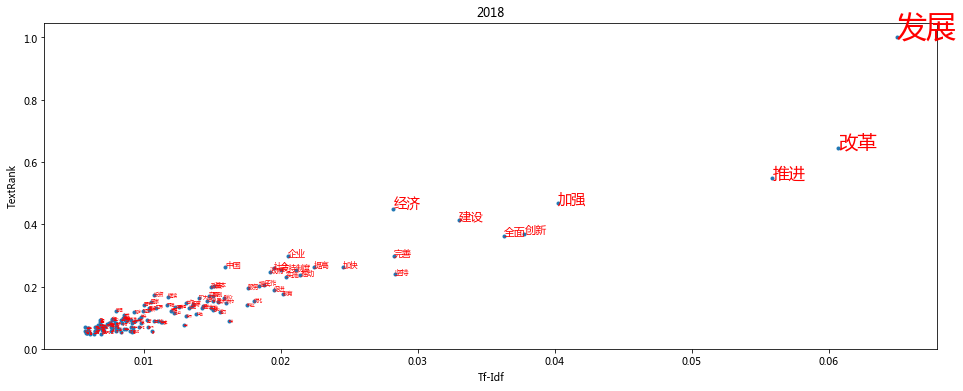

In [86]:
keywords(2)

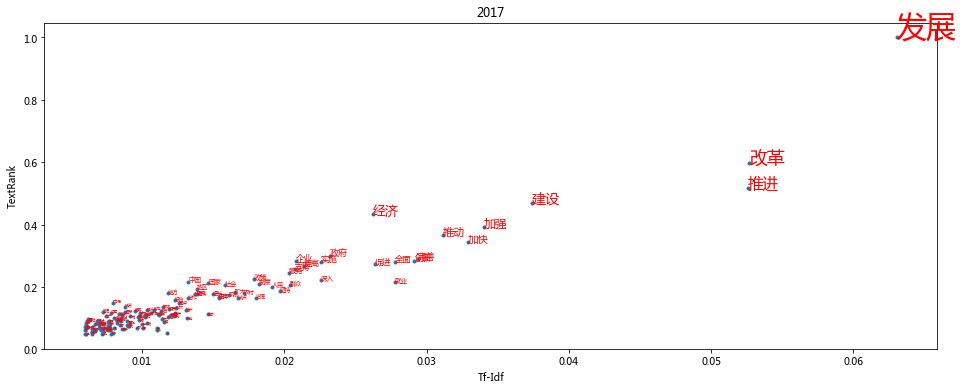

In [87]:
keywords(3)

#### 算法论文： 

TextRank: Bringing Order into Texts

### 基本思想:

* 将待抽取关键词的文本进行分词
* 以固定窗口大小(默认为5，通过span属性调整)，词之间的共现关系，构建图
* 计算图中节点的PageRank，注意是无向带权图

## 4. 词云

In [88]:
def wordcloudplot(txt, year):
    wordcloud = WordCloud(font_path='../data/msyh.ttf').generate(txt)
    # Open a plot of the generated image.
    fig = plt.figure(figsize=(16, 6),facecolor='white')
    plt.imshow(wordcloud)
    plt.title(year)
    plt.axis("off")
    #plt.show()

#### 基于tfidf过滤的词云

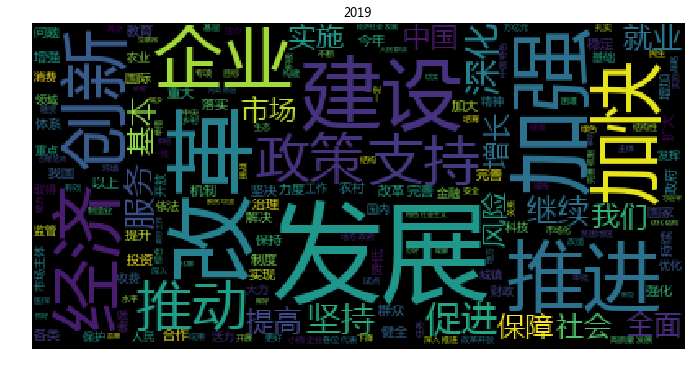

In [23]:
txt = reports[-1]
tfidf200= jieba.analyse.extract_tags(txt, topK=200, withWeight=False)
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i in tfidf200]
txt200 = r' '.join(seg_list)
wordcloudplot(txt200, txt[:4]) 

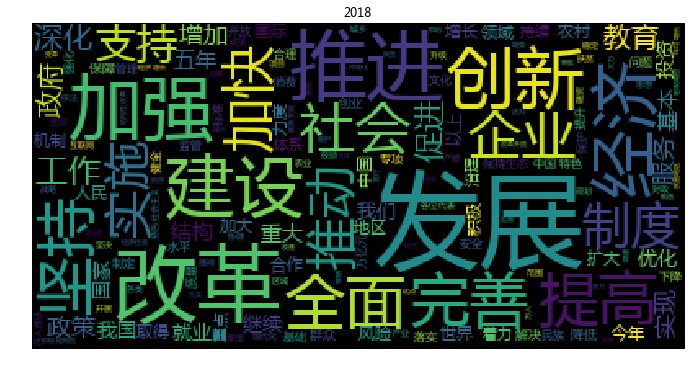

In [24]:
txt = reports[-2]
tfidf200= jieba.analyse.extract_tags(txt, topK=200, withWeight=False)
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i in tfidf200]
txt200 = r' '.join(seg_list)
wordcloudplot(txt200, txt[:4]) 

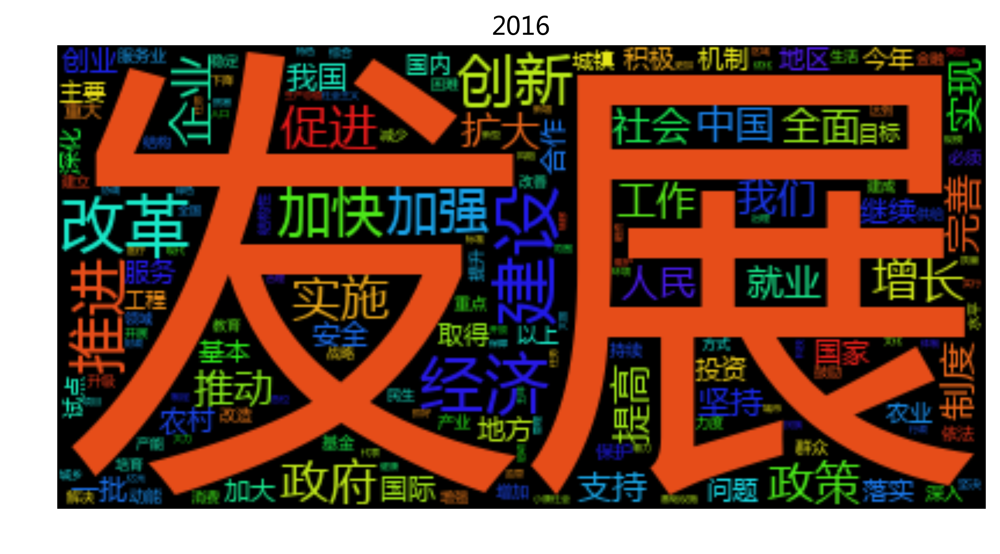

In [326]:
txt = reports[-2]
tfidf200= jieba.analyse.extract_tags(txt, topK=200, withWeight=False)
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i in tfidf200]
txt200 = r' '.join(seg_list)
wordcloudplot(txt200, txt[:4]) 

In [59]:
wordfreq = defaultdict(int)
for i in seg_list:
    wordfreq[i] +=1
wordfreq = [[i, wordfreq[i]] for i in wordfreq]

wordfreq.sort(key= lambda x:x[1], reverse = True )
u"、 ".join([ i[0] + u'（' + str(i[1]) +u'）' for i in wordfreq ])

'发展（125）、 改革（68）、 推进（65）、 建设（54）、 经济（52）、 加强（45）、 推动（42）、 加快（40）、 政府（36）、 创新（36）、 完善（35）、 企业（35）、 全面（35）、 促进（34）、 提高（32）、 就业（31）、 实施（31）、 中国（31）、 支持（29）、 深化（29）、 政策（28）、 服务（27）、 国家（26）、 人民（26）、 工作（26）、 制度（25）、 我们（25）、 深入（25）、 社会（25）、 增长（25）、 群众（24）、 坚持（24）、 今年（23）、 继续（23）、 地区（22）、 扩大（22）、 农村（20）、 坚决（20）、 机制（19）、 治理（19）、 稳定（19）、 地方（19）、 保障（18）、 安全（18）、 保护（18）、 持续（17）、 合作（17）、 市场（17）、 重点（17）、 实现（17）、 消费（16）、 投资（16）、 综合（16）、 落实（16）、 试点（16）、 结构（15）、 有效（15）、 维护（15）、 加大（15）、 产能（15）、 积极（15）、 领域（15）、 教育（15）、 改善（14）、 国际（14）、 国内（14）、 城市（14）、 我国（14）、 生态（14）、 以上（14）、 基本（14）、 问题（14）、 强化（13）、 增加（13）、 农业（13）、 提升（13）、 制定（13）、 力度（13）、 质量（13）、 引导（13）、 降低（13）、 依法（12）、 战略（12）、 升级（12）、 重要（12）、 标准（12）、 作用（12）、 健康（12）、 保持（12）、 增强（12）、 生产（12）、 文化（12）、 更加（12）、 必须（12）、 创业（12）、 目标（12）、 民生（12）、 下降（12）、 确保（11）、 取得（11）、 供给（11）、 生活（11）、 核心（11）、 规范（11）、 环境（11）、 收费（11）、 进一步（11）、 管理（11）、 做好（10）、 完成（10）、 资金（10）、 能力（10）、 不断（10）、 开展（10）、 产业（10）、 健全（10）、 水平（10）、 科技（10）、 体系（10）、 风险（10）、 世界（10）、 鼓励（10）、 重大（10）、 一年（10）、 监管（10

#### 基于停用词过滤的词云

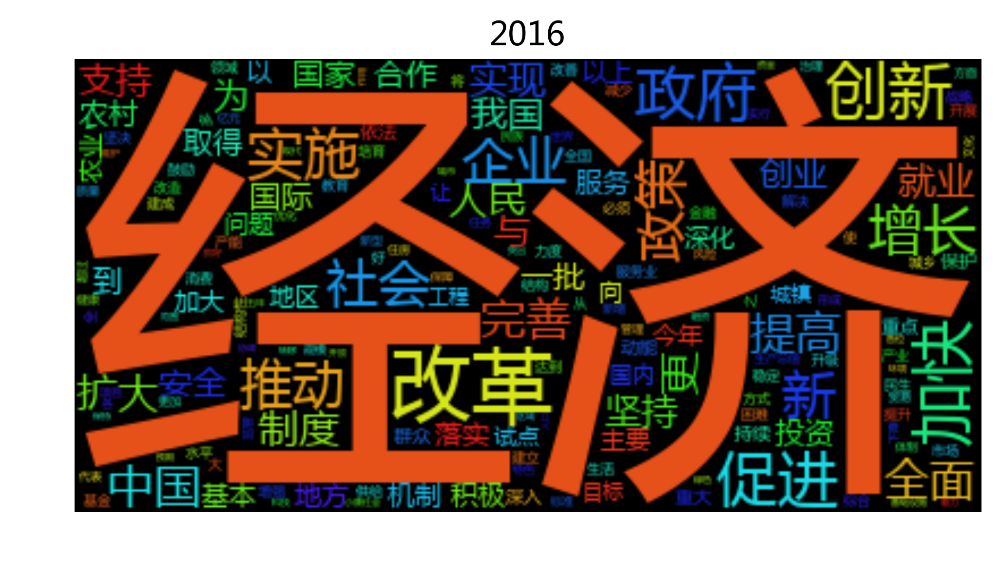

In [70]:
#jieba.add_word('股灾', freq=100, tag=None) 

txt = reports[-1]
seg_list = jieba.cut(txt, cut_all=False)
seg_list = [i for i in seg_list if i not in stopwords]
txt = r' '.join(seg_list)
wordcloudplot(txt, txt[:4])  
#file_path = '/Users/chengjun/GitHub/cjc2016/figures/wordcloud-' + txt[:4] + '.png'
#plt.savefig(file_path,dpi = 300, bbox_inches="tight",transparent = True)

### 绘制1954-2016政府工作报告词云

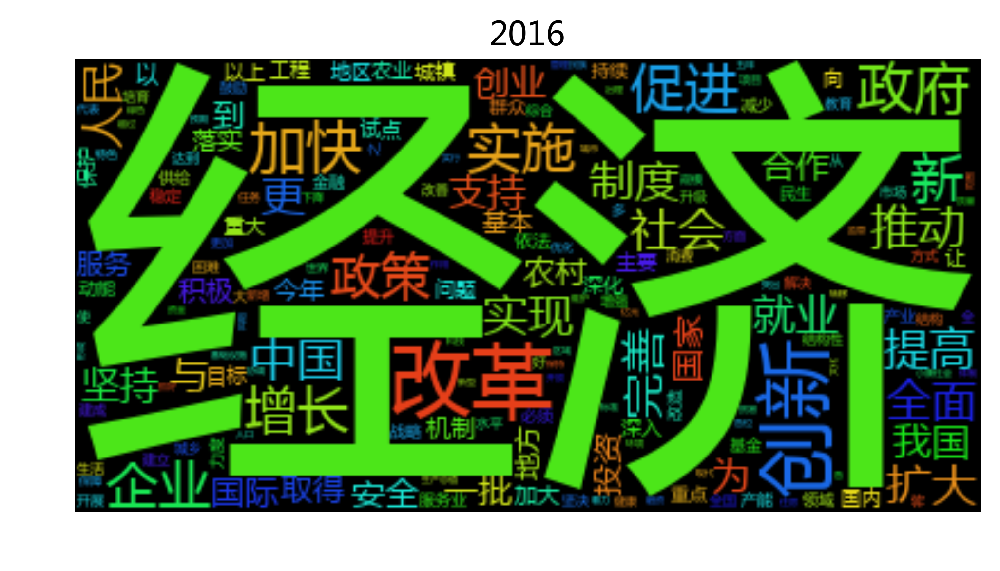

In [113]:
#jieba.add_word('股灾', freq=100, tag=None) 

for txt in reports:
    seg_list = jieba.cut(txt, cut_all=False)
    seg_list = [i for i in seg_list if i not in stopwords]
    txt = r' '.join(seg_list)
    wordcloudplot(txt, txt[:4]) 
    file_path = '../figure/wordcloud-' + txt[:4] + '.png'
    plt.savefig(file_path,dpi = 400, bbox_inches="tight",\
                transparent = True)


## 5. 词向量的时间序列

In [89]:
reports[0][:500]

'1954\t1954年政府工作报告——1954年5月23日在中华人民共和国第一届全国人民代表大会第一次会议上\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\xa0 国务院总理周恩来各位代表：\u3000\u3000我们第一届全国人民代表大会第一次会议，在听了刘少奇同志关于宪法草案的报告并进行了三天的讨论以后，已经光荣地完成了一件历史性的工作，通过了我们国家的根本法——中华人民共和国宪法，接着，又通过了几个重要的法律。现在，我代表中央人民政府作工作报告。\u3000\u3000我国伟大的人民革命的根本目的，是在于从帝国主义、封建主义和官僚资本主义的压迫下面，最后也从资本主义的束缚和小生产的限制下面，解放我国的生产力，使我国国民经济能够沿着社会主义的道路而得到有计划的迅速的发展，以便提高人民的物质生活和文化生活的水平，并且巩固我们国家的独立和安全。我国的经济原来是很落后的；如果我们不建设起强大的现代化的工业、现代化的农业、现代化的交通运输业和现代化的国防，我们就不能摆脱落后和贫困，我们的革命就不能达到目的。在一九四九年至一九五二年间，中央人民政府按照中国人民政治协商会议共同纲领的规定，先后完成了全国大陆的统一，完成了土地制度的改革，进'

In [90]:
reports[1][:500]

'1955\t1955年国务院政府工作报告关于发展国民经济的第一个五年计划的报告\xa0——1955年7月5日至6日在第一届全国人民代表大会第二次会议上\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\u3000\xa0 国务院副总理兼国家计划委员会主任李富春目录\xa0 一、国家在过渡时期的总任务\xa0 二、第一个五年计划概要\xa0 三、第一个五年计划的若干问题\xa0 （一）关于工业和运输业的基本建设问题\xa0 （二）关于工业的生产问题\xa0 （三）关于农业的增产问题\xa0 （四）关于对资本主义工商业的社会主义改造问题\xa0 （五）关于保证市场的稳定问题\xa0 （六）关于培养建设干部问题\xa0 （七）关于提高人民的物质生活和文化生活的水平问题\xa0 （八）关于厉行节约问题\xa0 （九）关于苏联和各人民民主国家同我国建设的关系\u3000四、为完成和超额完成第一个五年计划而奋斗\t\t\u3000\u3000各位代表：\u3000\u3000中华人民共和国国务院向第一届全国人民代表大会第二次会议提出关于发展国民经济第一个五年计划的议案，我现在代表国务院向本次大会作关于第一个五年计划的报告。\u3000\u3000中华人民共和国发展国民经济的第一个五年计划草案，是在中国共产党中央委员会和毛泽东主席的直接领导下编制完成的。一九五五年三月间经过中国共产党的全国代表会'

In [27]:
test = jieba.analyse.textrank(reports[0], topK=200, withWeight=False)

In [57]:
test = jieba.analyse.extract_tags(reports[1], topK=200, withWeight=False)

In [59]:
help(jieba.analyse.extract_tags)

Help on method extract_tags in module jieba.analyse.tfidf:

extract_tags(sentence, topK=20, withWeight=False, allowPOS=(), withFlag=False) method of jieba.analyse.tfidf.TFIDF instance
    Extract keywords from sentence using TF-IDF algorithm.
    Parameter:
        - topK: return how many top keywords. `None` for all possible words.
        - withWeight: if True, return a list of (word, weight);
                      if False, return a list of words.
        - allowPOS: the allowed POS list eg. ['ns', 'n', 'vn', 'v','nr'].
                    if the POS of w is not in this list,it will be filtered.
        - withFlag: only work with allowPOS is not empty.
                    if True, return a list of pair(word, weight) like posseg.cut
                    if False, return a list of words



In [127]:
import jieba.analyse

wordset = []
for k, txt in enumerate(reports):
    print(k)
    top20= jieba.analyse.extract_tags(txt, topK=200, withWeight=False)
    for w in top20:
        if w not in wordset:
            wordset.append(w)


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47


In [128]:
len(wordset)

1717

In [129]:
print(' '.join(wordset))

人民 我们 国家 我国 一九五三年 工业 一九五四年 必须 工作 建设 发展 和平 一九四九年 社会主义 一九五 国家机关 生产 计划 全国 农业 亚洲 美国 事业 企业 应当 经济 这些 改造 增加 并且 完成 但是 已经 等于 合作社 集团 方面 需要 台湾 资本主义 反对 几年 生活 建立 为了 技术 这个 进行 日内瓦 问题 一九五二年 各级 侵略 中央人民政府 可以 比重 改善 东南亚 现代化 中国 关系 反革命 卖国 会议 对于 条约 浪费 加强 注意 保证 任务 努力 正在 军事同盟 根据 能够 组织 基本建设 克服 少数民族 文化 全国人民代表大会 许多 工作人员 总产值 领导 职工 协议 重要 过去 困难 提高 战争 印度支那 今年 迅速 政府 逐步 国营商业 合作 五年 现在 参加 集体 他们 分子 一切 世界 公私合营 解决 商业 机关 得到 现象 因为 今后 其他 民主 胜利 完全 力量 斗争 苏联 群众 地方 计划供应 朝鲜 防务 五年计划 容许 重工业 改进 没有 百分之三十 实行 不能 人民代表大会 所谓 财政 政策 解放 社会 广大 运动 产量 很大 充分 缺点 安全 官僚主义 国营 巩固 不少 落后 增长 达到 一个 恢复 由于 农民 交通运输业 原则 中华人民共和国 而且 各国 中央 依靠 教育 人民共和国 实现 选举 节约 四点 破坏 关于 代表 保障 工业化 破坏活动 时期 作用 百分之八十 资金 采取 棉花 保卫 利益 同时 权利 主要 或者 华侨 制度 不顾 继续 法律 劳动 蒋介石 预算 就是 应该 增产 第一个 私营 国民经济 工商业 单位 一九五七年 可能 年产能力 过渡时期 适当 规定 基础 各种 供应 产品 万吨 水平 投资 帮助 手工业 这种 设计 限额 工厂 粮食 这样 扩大 形式 合作化 制造 积极 条件 工人 建成 资本家 部门 铁路 非生产性 原料 援助 收购 工业生产 因此 方针 加以 两年 经验 规模 新建 工程 全部 超额完成 总任务 设备 中国共产党 厂矿 指标 工人阶级 轻工业 产值 办法 百分之五十 定货 必要 周转量 文化教育 以上 情况 特别 学习 团结 某些 错误 职员 发挥 重大 施工 培养 百分之七十 工业品 播种面积 有些 一些 按照 地区 它们 巨大 要求 开始 百分之一百 曾

In [38]:
from collections import defaultdict

data = defaultdict(dict)
years = [int(i[:4]) for i in reports]
for i in wordset:
    for year in years:
        data[i][year] = 0 

In [39]:
for txt in reports:
    year = int(txt[:4])
    top1000= jieba.analyse.textrank(txt, topK=1000, withWeight=True)
    for ww in top1000:
        word, weight = ww
        if word in wordset:
            data[word][year]+= weight

In [45]:
word_weight = []
for i in data:
    word_weight.append([i, np.sum(list(data[i].values()))])

In [46]:
word_weight[:2]

[['上交', 0.24873017673930453], ['推进', 10.481536397526137]]

In [47]:
word_weight.sort(key= lambda x:x[1], reverse = True )
top50 = [i[0] for i in word_weight[:50]]

In [48]:
' '.join(top50) 

'发展 建设 经济 加强 企业 工作 改革 国家 人民 继续 社会主义 提高 社会 生产 农业 政府 制度 增加 推进 问题 促进 增长 加快 农村 方面 管理 进行 重点 坚持 全国 教育 市场 投资 完善 地区 工业 支持 政策 中国 实行 计划 文化 生活 扩大 实现 基本 改善 建立 群众 技术'

In [52]:
def plotEvolution(word, color, linestyle, marker):
    cx = data[word]
    plt.plot(list(cx.keys()), list(cx.values()), color = color, 
             linestyle=linestyle, marker=marker, label= word)
    plt.legend(loc=2,fontsize=8)
    plt.ylabel(u'词语重要性')


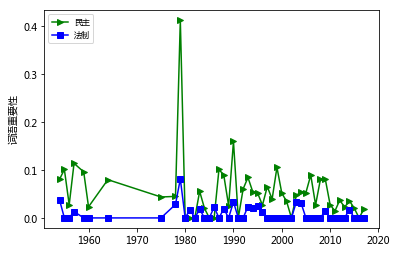

In [53]:
plotEvolution(u'民主', 'g', '-', '>')
plotEvolution(u'法制', 'b', '-', 's')

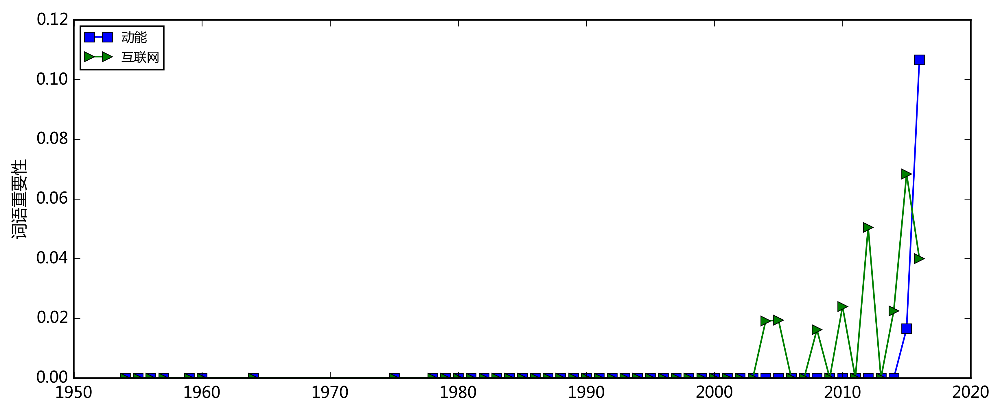

In [363]:
plotEvolution(u'动能', 'b', '-', 's')
plotEvolution(u'互联网', 'g', '-', '>')

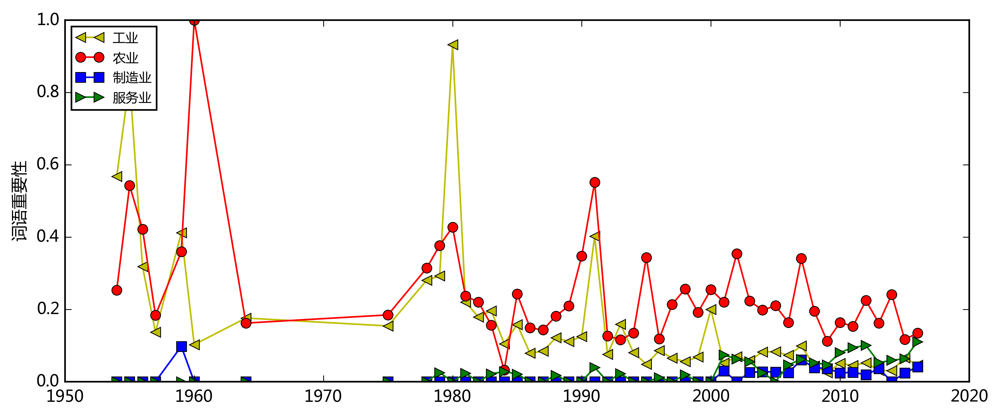

In [364]:
plotEvolution(u'工业', 'y', '-', '<')
plotEvolution(u'农业', 'r', '-', 'o')
plotEvolution(u'制造业', 'b', '-', 's')
plotEvolution(u'服务业', 'g', '-', '>')


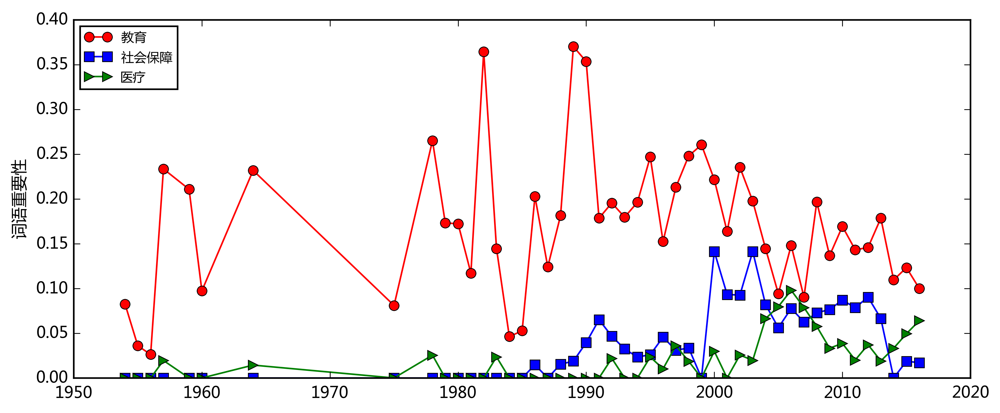

In [362]:
plotEvolution(u'教育', 'r', '-', 'o')
plotEvolution(u'社会保障', 'b', '-', 's')
plotEvolution(u'医疗', 'g', '-', '>')


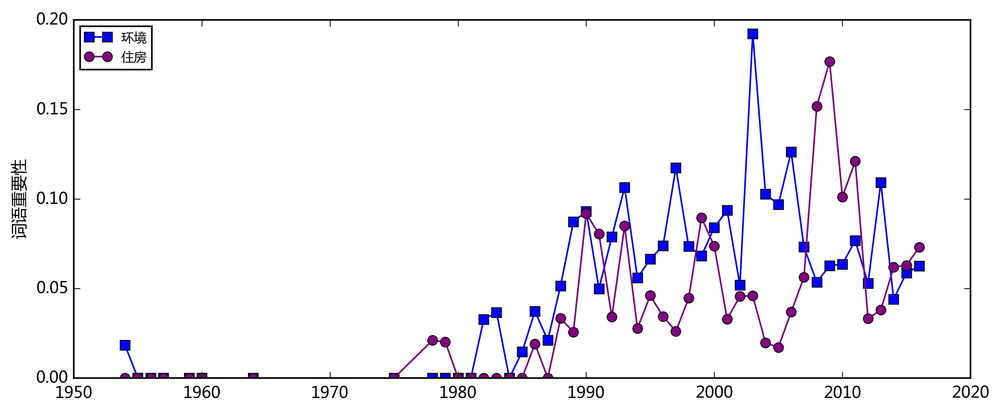

In [356]:
plotEvolution(u'环境', 'b', '-', 's')
plotEvolution(u'住房', 'purple', '-', 'o')

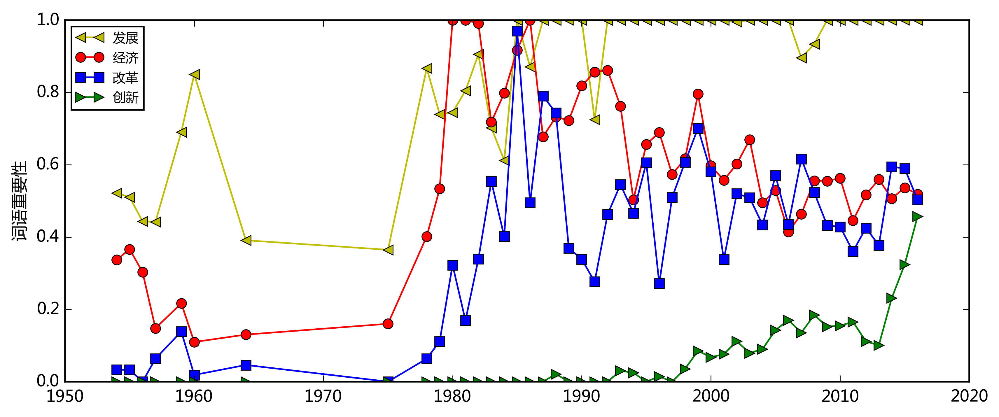

In [357]:
plotEvolution(u'发展', 'y', '-', '<')
plotEvolution(u'经济', 'r', '-', 'o')
plotEvolution(u'改革', 'b', '-', 's')
plotEvolution(u'创新', 'g', '-', '>')

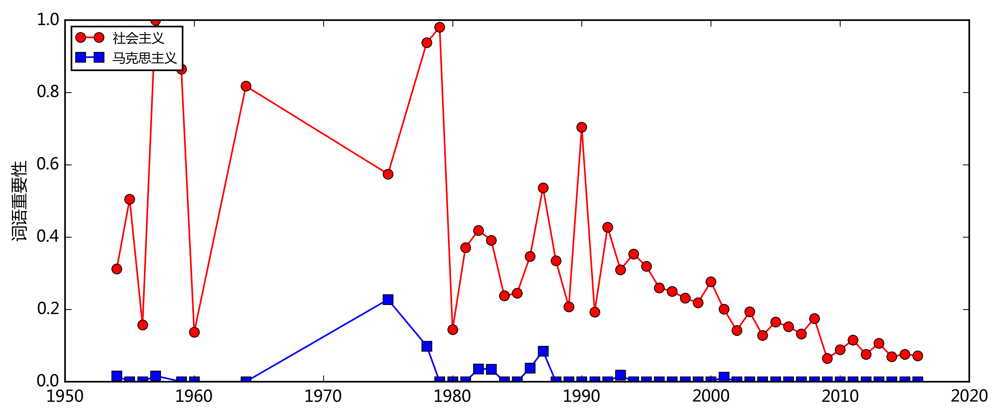

In [359]:
plotEvolution(u'社会主义', 'r', '-', 'o')
plotEvolution(u'马克思主义', 'b', '-', 's')

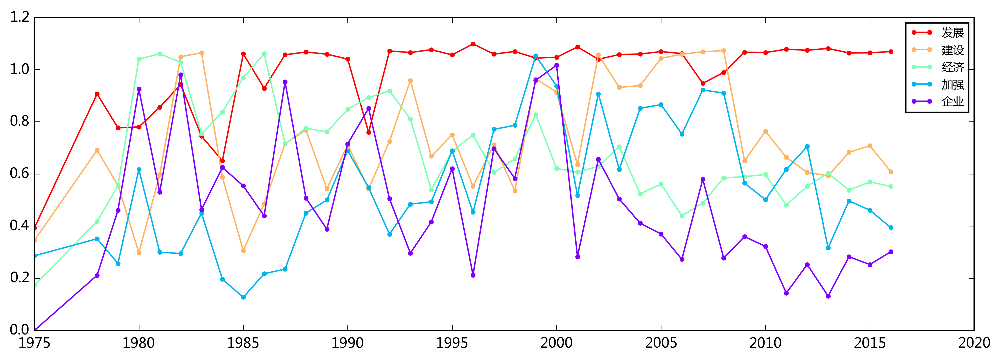

In [208]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in enumerate(top50[:5]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

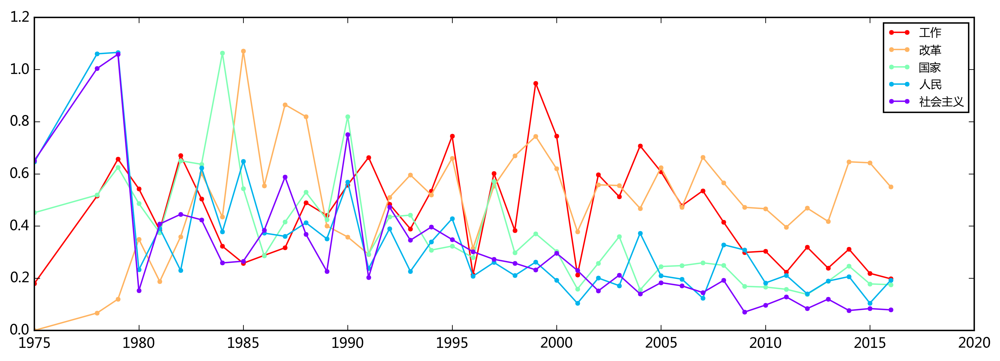

In [207]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in enumerate(top50[5:10]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

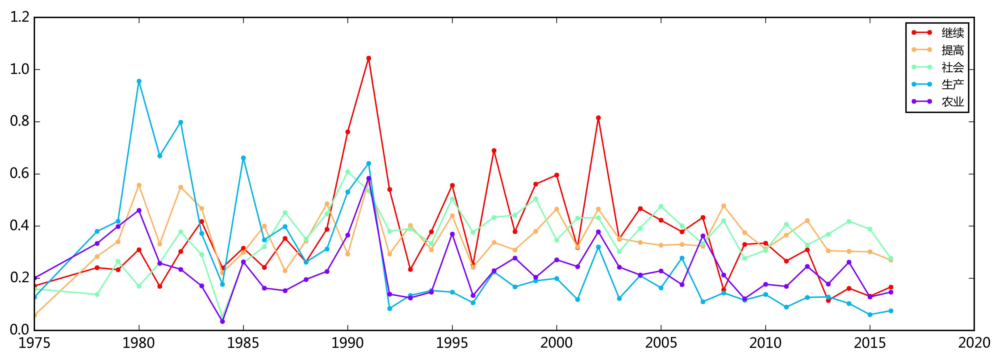

In [206]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[10:15]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

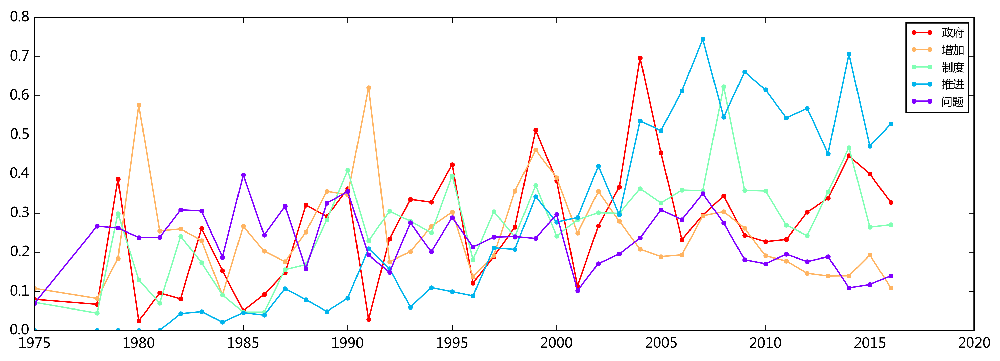

In [205]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[15:20]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

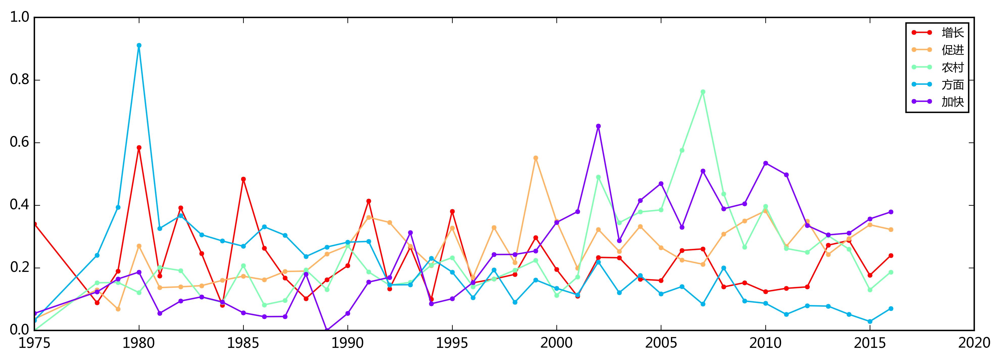

In [204]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[20:25]):
    years = data[word].keys()[-40:]
    tfidfs = data[word].values()[-40:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

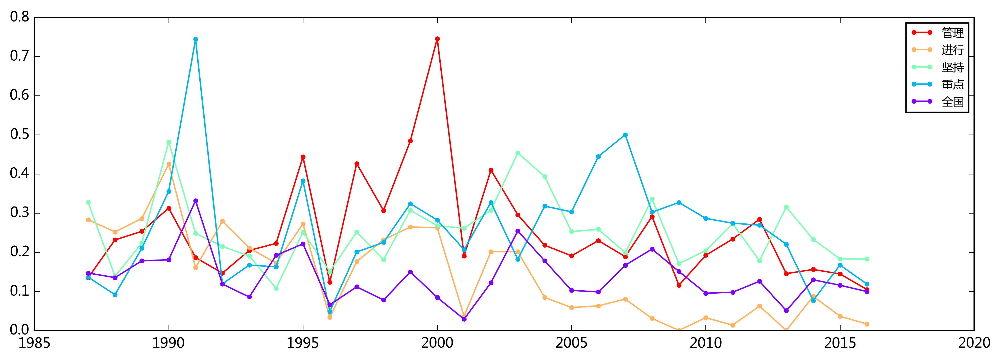

In [202]:
fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',5)

for k, word in  enumerate(top50[25:30]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

# kmeans 聚类

In [209]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
dataX = []
wordX = []
for word in top50:
    dataX.append(data[word].values()[-40:])
    wordX.append(word)
dataX = np.array(dataX)

In [210]:
dataX

array([[ 0.39284121,  0.90665311,  0.77657535, ...,  1.06351347,
         1.06421625,  1.06899944],
       [ 0.34494242,  0.69077968,  0.55668702, ...,  0.68252707,
         0.70822817,  0.60889902],
       [ 0.17303628,  0.41761107,  0.55415715, ...,  0.53748179,
         0.56932235,  0.55195392],
       ..., 
       [ 0.14998888,  0.3440277 ,  0.23697201, ...,  0.10974867,
         0.10210809,  0.12931368],
       [ 0.04497681,  0.12520492,  0.25926694, ...,  0.05835174,
         0.03954806,  0.04108153],
       [ 0.11544036,  0.20476903,  0.10921159, ...,  0.07690967,
         0.05190462,  0.03248575]])

/Users/chengjun/anaconda/lib/python2.7/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)


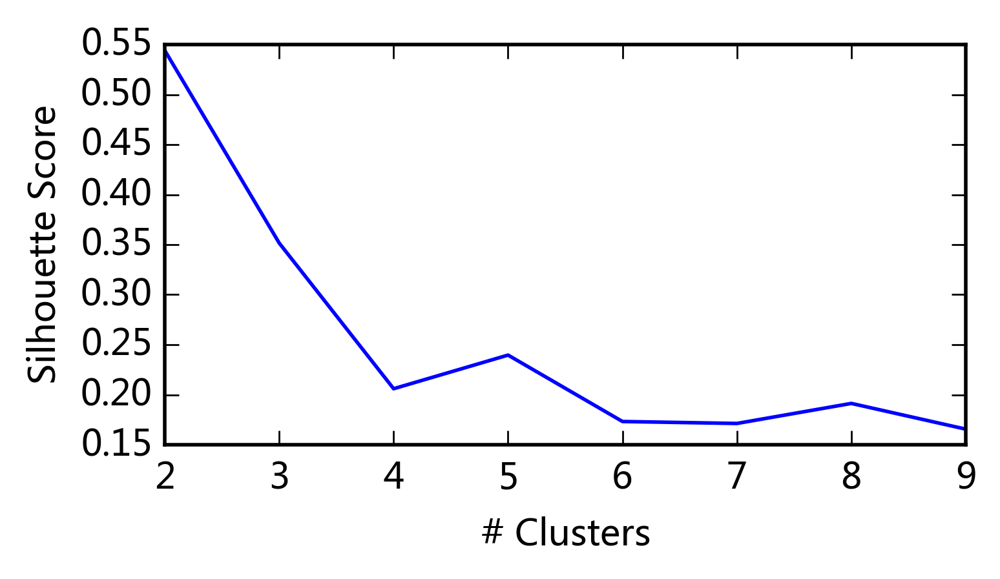

In [211]:
import numpy as np
from sklearn.cluster import KMeans
silhouette_score = []
for cluster_num in range(2, 10):
    kmeans_model = KMeans(n_clusters=cluster_num, random_state=1).fit(dataX)
    labels = kmeans_model.labels_
    sscore = metrics.silhouette_score(dataX, labels, metric='euclidean')
    silhouette_score.append(sscore)

fig = plt.figure(figsize=(4, 2),facecolor='white')    
plt.plot(range(2, 10), silhouette_score)
plt.xlabel('# Clusters')
plt.ylabel('Silhouette Score')
plt.show()

The score is bounded between -1 for incorrect clustering and +1 for highly dense clustering. Scores around zero indicate overlapping clusters.
The score is higher when clusters are dense and well separated, which relates to a standard concept of a cluster.

In [212]:
kmeans_model = KMeans(n_clusters=2, random_state=1).fit(dataX)
labels = kmeans_model.labels_
labels

array([1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0], dtype=int32)

In [213]:
print ' '.join(wordX)

发展 建设 经济 加强 企业 工作 改革 国家 人民 社会主义 继续 提高 社会 生产 农业 政府 增加 制度 推进 问题 增长 促进 农村 方面 加快 管理 进行 坚持 重点 全国 教育 投资 工业 完善 市场 地区 支持 实行 计划 政策 生活 文化 扩大 实现 中国 基本 建立 群众 技术 关系


In [214]:
print '\t'.join([wordX[index] \
                 for index in np.where(labels==0)[0]])

国家	人民	社会主义	继续	提高	社会	生产	农业	政府	增加	制度	推进	问题	增长	促进	农村	方面	加快	管理	进行	坚持	重点	全国	教育	投资	工业	完善	市场	地区	支持	实行	计划	政策	生活	文化	扩大	实现	中国	基本	建立	群众	技术	关系


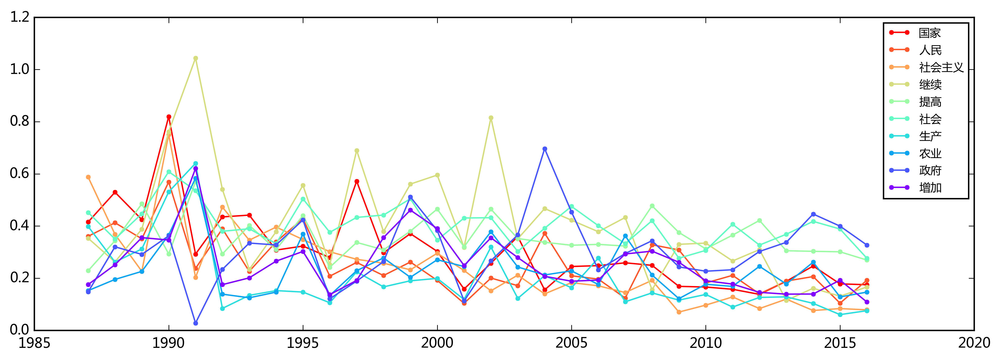

In [215]:
word_cluster1 = [wordX[index] for index in np.where(labels==0)[0]]

fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',10)

for k, word in  enumerate(word_cluster1[:10]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

In [216]:
print '\t'.join([wordX[index] for index in np.where(labels==1)[0]])

发展	建设	经济	加强	企业	工作	改革


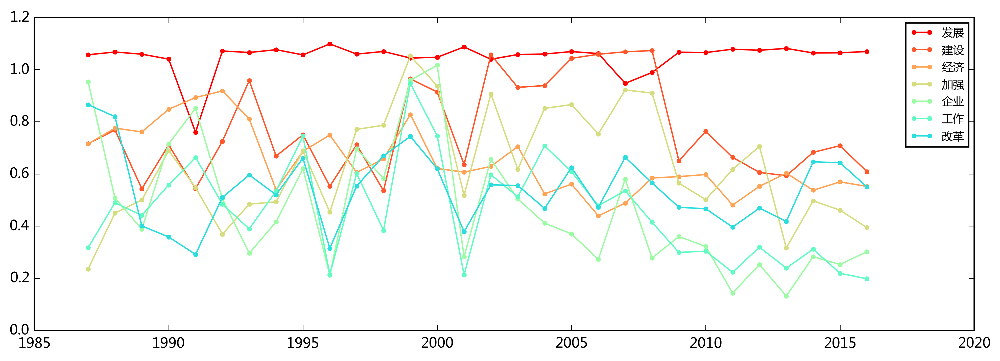

In [217]:
word_cluster2 = [wordX[index] for index in np.where(labels==1)[0]]

fig = plt.figure(figsize=(12, 4),facecolor='white')
cmap = cm.get_cmap('rainbow_r',10)

for k, word in  enumerate(word_cluster2[:10]):
    years = data[word].keys()[-30:]
    tfidfs = data[word].values()[-30:]
    plt.plot(years, tfidfs, color=cmap(k), linestyle='-',marker='.',label= word)
plt.legend(loc=1,fontsize=8)
plt.show()

# 词性标注

In [137]:
import jieba.posseg as pseg
words = pseg.cut("我爱北京天安门")
words = [str(w).split('/') for w in words]
for i in words:
    print i[0], i[1]

我 r
爱 v
北京 ns
天安门 ns


## ICTCLAS 汉语词性标注集 

汉语文本词性标注标记集 

Ag 形语素 形容词性语素。形容词代码为a，语素代码ｇ前面置以A。 

a 形容词 取英语形容词adjective的第1个字母。 

ad 副形词 直接作状语的形容词。形容词代码a和副词代码d并在一起。 

an 名形词 具有名词功能的形容词。形容词代码a和名词代码n并在一起。 

b 区别词 取汉字“别”的声母。 

c 连词 取英语连词conjunction的第1个字母。 

Dg 副语素 副词性语素。副词代码为d，语素代码ｇ前面置以D。 

d 副词 取adverb的第2个字母，因其第1个字母已用于形容词。 

e 叹词 取英语叹词exclamation的第1个字母。 

f 方位词 取汉字“方” 

g 语素 绝大多数语素都能作为合成词的“词根”，取汉字“根”的声母。 

h 前接成分 取英语head的第1个字母。 

i 成语 取英语成语idiom的第1个字母。 

j 简称略语 取汉字“简”的声母。 

k 后接成分 

l 习用语 习用语尚未成为成语，有点“临时性”，取“临”的声母。 

m 数词 取英语numeral的第3个字母，n，u已有他用。 

Ng 名语素 名词性语素。名词代码为n，语素代码ｇ前面置以N。 

n 名词 取英语名词noun的第1个字母。 

nr 人名 名词代码n和“人(ren)”的声母并在一起。 

ns 地名 名词代码n和处所词代码s并在一起。 

nt 机构团体 “团”的声母为t，名词代码n和t并在一起。 

nz 其他专名 “专”的声母的第1个字母为z，名词代码n和z并在一起。 

o 拟声词 取英语拟声词onomatopoeia的第1个字母。 

p 介词 取英语介词prepositional的第1个字母。 

q 量词 取英语quantit的第1个字母。 

r 代词 取英语代词pronoun的第2个字母,因p已用于介词。 

s 处所词 取英语space的第1个字母。 

Tg 时语素 时间词性语素。时间词代码为t,在语素的代码g前面置以T。 

t 时间词 取英语time的第1个字母。 

u 助词 取英语助词auxiliary 

Vg 动语素 动词性语素。动词代码为v。在语素的代码g前面置以V。 

v 动词 取英语动词verb的第一个字母。 

vd 副动词 直接作状语的动词。动词和副词的代码并在一起。 

vn 名动词 指具有名词功能的动词。动词和名词的代码并在一起。 

w 标点符号 

x 非语素字 非语素字只是一个符号，字母x通常用于代表未知数、符号。 

y 语气词 取汉字“语”的声母。 

z 状态词 取汉字“状”的声母的前一个字母。 

------------------------------------------------------------------------------- 

a:        形容词 
b:        区别词 
c:        连词 
d:        副词 
e:        叹词 
g:        语素字 
h:        前接成分 
i:        习用语 
j:        简称 
k:        后接成分 
m:        数词 
n:        普通名词 
nd:        方位名词 
nh:        人名 
ni:        机构名 
nl:        处所名词 
ns:        地名 
nt:        时间词 
nz:        其他专名 
o:        拟声词 
p:        介词 
q:        量词 
r:        代词 
u:        助词 
v:        动词 
wp:        标点符号 
ws:        字符串 
x:        非语素字 


# 主题模型

In [230]:
def getCorpus(data):
    processed_docs = [tokenize(doc) for doc in data]
    word_count_dict = gensim.corpora.Dictionary(processed_docs)
    print "In the corpus there are", len(word_count_dict), "unique tokens"
    word_count_dict.filter_extremes(no_below=5, no_above=0.2) # word must appear >5 times, and no more than 10% documents
    print "After filtering, in the corpus there are only", len(word_count_dict), "unique tokens"
    bag_of_words_corpus = [word_count_dict.doc2bow(pdoc) for pdoc in processed_docs]
    return bag_of_words_corpus, word_count_dict

def cleancntxt(txt, stopwords):
    tfidf1000= jieba.analyse.extract_tags(txt, topK=1000, withWeight=False)
    seg_generator = jieba.cut(txt, cut_all=False)
    seg_list = [i for i in seg_generator if i not in stopwords]
    seg_list = [i for i in seg_list if i != u' ']
    seg_list = [i for i in seg_list if i in tfidf1000]
    return(seg_list)

def getCnCorpus(data):
    processed_docs = [cleancntxt(doc) for doc in data]
    word_count_dict = gensim.corpora.Dictionary(processed_docs)
    print "In the corpus there are", len(word_count_dict), "unique tokens"
    #word_count_dict.filter_extremes(no_below=5, no_above=0.2) 
    # word must appear >5 times, and no more than 10% documents
    print "After filtering, in the corpus there are only", len(word_count_dict), "unique tokens"
    bag_of_words_corpus = [word_count_dict.doc2bow(pdoc) for pdoc in processed_docs]
    return bag_of_words_corpus, word_count_dict

def inferTopicNumber(bag_of_words_corpus, num, word_count_dict):
    lda_model = gensim.models.LdaModel(bag_of_words_corpus, num_topics=num, id2word=word_count_dict, passes=10)
    _ = lda_model.print_topics(-1) #use _ for throwaway variables.
    logperplexity = lda_model.log_perplexity(bag_of_words_corpus)
    return logperplexity

def ppnumplot(topicnum,logperplexity): #做主题数与困惑度的折线图
    plt.plot(topicnum,logperplexity,color="red",linewidth=2)
    plt.xlabel("Number of Topic")
    plt.ylabel("Perplexity")
    plt.show()  
    
# 定义一些常用的函数
def flushPrint(variable):
    if variable %10^2 == 0:
        sys.stdout.write('\r')
        sys.stdout.write('%s' % variable)
        sys.stdout.flush()
    
    
def top(data):
    for i in data:
        print i
        
def freq(data):
    dtable = defaultdict(int)
    for i in data:
        dtable[i] += 1
    return dtable

def sortdict(data):
    '''data is a dict, sorted by value'''
    return sorted(data.items(), lambda x, y: cmp(x[1], y[1]), reverse=True) 


## 对2016年政府工作报告建立主题模型

In [118]:
import urllib2
from bs4 import BeautifulSoup
import sys

url2016 = 'http://news.xinhuanet.com/fortune/2016-03/05/c_128775704.htm'
content = urllib2.urlopen(url2016).read()
soup = BeautifulSoup(content) 


In [231]:
gov_report_2016 = [s.text for s in soup('p')]
for i in gov_report_2016[:10]:print i

政府工作报告
——2016年3月5日在第十二届全国人民代表大会第四次会议上
国务院总理 李克强
各位代表：
　　现在，我代表国务院，向大会报告政府工作，请予审议，并请全国政协各位委员提出意见。
　　一、2015年工作回顾
　　过去一年，我国发展面临多重困难和严峻挑战。在以习近平同志为总书记的党中央坚强领导下，全国各族人民以坚定的信心和非凡的勇气，攻坚克难，开拓进取，经济社会发展稳中有进、稳中有好，完成了全年主要目标任务，改革开放和社会主义现代化建设取得新的重大成就。
　　——经济运行保持在合理区间。国内生产总值达到67.7万亿元，增长6.9%，在世界主要经济体中位居前列。粮食产量实现"十二连增"，居民消费价格涨幅保持较低水平。特别是就业形势总体稳定，城镇新增就业1312万人，超过全年预期目标，成为经济运行的一大亮点。
　　——结构调整取得积极进展。服务业在国内生产总值中的比重上升到50.5%，首次占据"半壁江山"。消费对经济增长的贡献率达到66.4%。高技术产业和装备制造业增速快于一般工业。单位国内生产总值能耗下降5.6%。
　　——发展新动能加快成长。创新驱动发展战略持续推进，互联网与各行业加速融合，新兴产业快速增长。大众创业、万众创新蓬勃发展，全年新登记注册企业增长21.6%，平均每天新增1.2万户。新动能对稳就业、促升级发挥了突出作用，正在推动经济社会发生深刻变革。


In [232]:
def clean_txt(txt):
    for i in [u'、', u'，', u'—', u'！', u'。', u'《', u'》', u'（', u'）']:
        txt = txt.replace(i, ' ')
    return txt


In [233]:
gov_report_2016 = [clean_txt(i) for i in gov_report_2016]
    

In [234]:
for i in gov_report_2016[:10]:print i

政府工作报告
  2016年3月5日在第十二届全国人民代表大会第四次会议上
国务院总理 李克强
各位代表：
　　现在 我代表国务院 向大会报告政府工作 请予审议 并请全国政协各位委员提出意见 
　　一 2015年工作回顾
　　过去一年 我国发展面临多重困难和严峻挑战 在以习近平同志为总书记的党中央坚强领导下 全国各族人民以坚定的信心和非凡的勇气 攻坚克难 开拓进取 经济社会发展稳中有进 稳中有好 完成了全年主要目标任务 改革开放和社会主义现代化建设取得新的重大成就 
　　  经济运行保持在合理区间 国内生产总值达到67.7万亿元 增长6.9% 在世界主要经济体中位居前列 粮食产量实现"十二连增" 居民消费价格涨幅保持较低水平 特别是就业形势总体稳定 城镇新增就业1312万人 超过全年预期目标 成为经济运行的一大亮点 
　　  结构调整取得积极进展 服务业在国内生产总值中的比重上升到50.5% 首次占据"半壁江山" 消费对经济增长的贡献率达到66.4% 高技术产业和装备制造业增速快于一般工业 单位国内生产总值能耗下降5.6% 
　　  发展新动能加快成长 创新驱动发展战略持续推进 互联网与各行业加速融合 新兴产业快速增长 大众创业 万众创新蓬勃发展 全年新登记注册企业增长21.6% 平均每天新增1.2万户 新动能对稳就业 促升级发挥了突出作用 正在推动经济社会发生深刻变革 


In [227]:
len(gov_report_2016[5:-1])

103

In [243]:
jieba.add_word(u'屠呦呦', freq=None, tag=None)
#del_word(word) 

' '.join(cleancntxt(u'屠呦呦获得了诺贝尔医学奖。', stopwords))

屠呦呦 获得 诺贝尔 医学奖


In [244]:
processed_docs = [cleancntxt(doc, stopwords) for doc in gov_report_2016[5:-1]]
word_count_dict = gensim.corpora.Dictionary(processed_docs)
print "In the corpus there are", len(word_count_dict), "unique tokens"
# word_count_dict.filter_extremes(no_below=5, no_above=0.2) # word must appear >5 times, and no more than 10% documents
# print "After filtering, in the corpus there are only", len(word_count_dict), "unique tokens"
bag_of_words_corpus = [word_count_dict.doc2bow(pdoc) for pdoc in processed_docs]



In the corpus there are 2622 unique tokens


In [245]:
tfidf = models.TfidfModel(bag_of_words_corpus )
corpus_tfidf = tfidf[bag_of_words_corpus ]
lda_model = gensim.models.LdaModel(corpus_tfidf, num_topics=20, id2word=word_count_dict, passes=10)
#lda_model = gensim.models.LdaMulticore(corpus_tfidf, num_topics=10, id2word=word_count_dict, passes=10)

In [246]:
perplexity_list = [inferTopicNumber(bag_of_words_corpus, num, word_count_dict) for num in [5, 15, 20, 25, 30, 35, 40 ]]

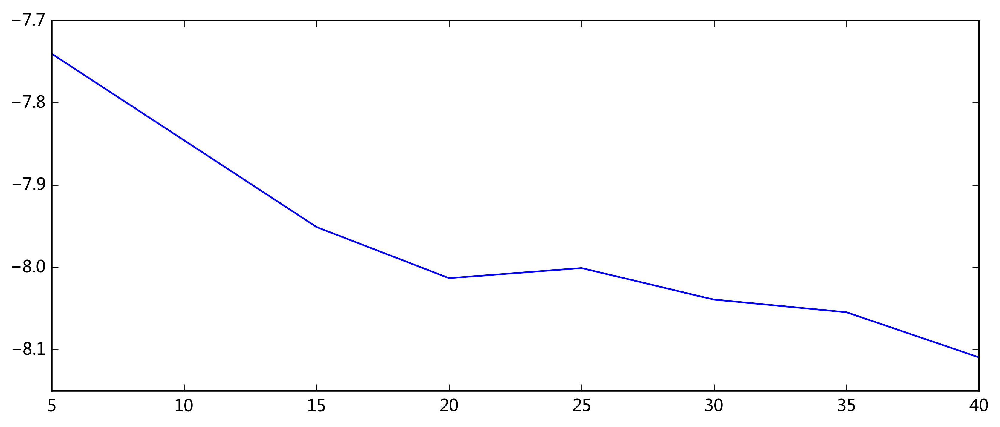

In [247]:
plt.plot([5, 15, 20, 25, 30, 35, 40], perplexity_list)

In [252]:
topictermlist = lda_model.print_topics(-1)
top_words = [[j.split('*')[1] for j in i.split(' + ')] for i in topictermlist] 
for i in top_words: print " ".join(i) + '\n'

2016 重点 供给 增收 结构性 农民 医保 深化 协定 自贸区

就业 燃煤 创业 排放 计划 完成 坚定 重大成就 稳中有进 攻坚克难

基本 就业 宗教 贯彻 发挥 救助 左右 保持 增长 社会

领导人 调控 论坛 峰会 宏观调控 货币政策 区间 联合国 会议 系列

军队 残疾人 大国 利益 社会 国防 妇女 儿童 外交 补贴

回顾 2015 经济 投资 服务 开展 促进 城市 规模 深化

出口 调控 贸易 存量 进口 外贸 安全 遏制 风险 注重

以下 一年 主要 贡献 赢得 富强 奋斗 奋发进取 复兴 民主

审批 万元 动能 结构性 优化 事项 供给 2020 腐败分子 惩处

金融 存在 一些 汇率 规范 适当 支付 债务 科技领域 诺贝尔

需求 大气 生态环境 无穷 自信心 优越性 凝聚力 奋力 展现 巨大

各位 代表 节能 环保 诚挚 表示 感谢 结果 随机 过程

规划 考虑 五年 海洋 国民经济 第十三个 强国 纲要 草案 6.5

港澳 生态 香港 投资 挑战 积累 融资 长期 重大项目 严格

经济 创新 改革 企业 政府 地方 政策 加快 实施 合作

非公有制 财政支出 万公里 教育 里程 范围 水平 所有 学校 品质

民生 脱贫 农业 国有企业 扶贫 世界反法西斯战争 保障 国有资产 市场化 人民

贸易 党风廉政 自贸 经济运行 体制 亿美元 深化改革 对外贸易 出口 形势

八个 两岸 重点 做好 方面 居民 下决心 事关 环境治理 双赢

消费 支付 外商投资 成绩 存款 百分点 旅游 这些 减少 项目



In [249]:
top_words_shares = [[j.split('*')[0] for j in i.split(' + ')] for i in topictermlist] 
top_words_shares = [map(float, i) for i in top_words_shares]
def weightvalue(x):
    return (x - np.min(top_words_shares))*40/(np.max(top_words_shares) -np.min(top_words_shares)) + 10
 
top_words_shares = [map(weightvalue, i) for i in top_words_shares]  

def plotTopics(mintopics, maxtopics):
    num_top_words = 10
    plt.rcParams['figure.figsize'] = (10.0, 4.0)  
    n = 0
    for t in range(mintopics , maxtopics):
        plt.subplot(2, 15, n + 1)  # plot numbering starts with 1
        plt.ylim(0, num_top_words)  # stretch the y-axis to accommodate the words
        plt.xticks([])  # remove x-axis markings ('ticks')
        plt.yticks([]) # remove y-axis markings ('ticks')
        plt.title(u'主题 #{}'.format(t+1), size = 5)
        words = top_words[t][0:num_top_words ]
        words_shares = top_words_shares[t][0:num_top_words ]
        for i, (word, share) in enumerate(zip(words, words_shares)):
            plt.text(0.05, num_top_words-i-0.9, word, fontsize= np.log(share*10))
        n += 1

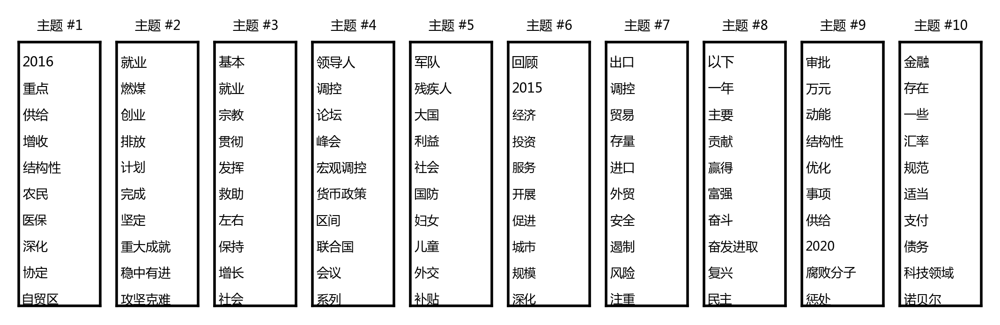

In [250]:
plotTopics(0, 10)


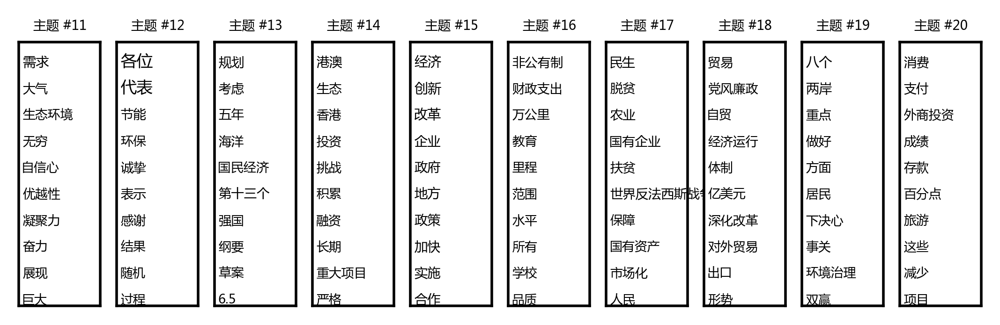

In [251]:
plotTopics(10, 20)